# Frame

## 하이퍼 파라미터 : 1. 모듈

In [114]:
#--Tensorflow Framework + SKLEARN
import tensorflow as tf
from tensorflow import keras
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.preprocessing.image import ImageDataGenerator, img_to_array, load_img
from sklearn.model_selection import train_test_split
import numpy as np

#--check program performance
import time
import psutil

#--data visualization
import matplotlib.pyplot as plt
import pandas as pd
from tqdm import tqdm
import sys
from IPython.display import HTML
from base64 import b64encode

#--for manipulating video&image datas
import json
import os
import cv2
from PIL import Image 
import random
import dlib
import math

## 하이퍼 파라미터 : 2. 데이터셋 위치 설정

In [111]:
ROOT_DATA_FOLDER = '../../../dataset/deepfake_detection'
REAL_DATA_PATH = os.path.join(ROOT_DATA_FOLDER, 'real')
FAKE_DATA_PATH = os.path.join(ROOT_DATA_FOLDER, 'fake')
REAL_DATASET_LIST = [file for file in os.listdir(REAL_DATA_PATH) if file.endswith('.png')]
FAKE_DATASET_LIST = [file for file in os.listdir(FAKE_DATA_PATH) if file.endswith('.png')]

## 하이퍼 파라미터 : 3. 데이터셋 설정

In [138]:
TRAINABLE_FLOWER_DATA = []
LABEL = []

## 하이퍼 파라미터 : 4. 학습 설정

In [82]:
BATCH_SIZE=128
EPOCHS=10

## [ 1 ] 데이터셋 살펴보기

In [83]:
deepfake_folder_list = os.listdir(ROOT_DATA_FOLDER)
ext_list = []
print("deepfake_detection 폴더 안의 Data 갯수 : ", len(deepfake_folder_list))

deepfake_detection 폴더 안의 Data 갯수 :  405


##### deepfake_detection 폴더 안에 있는 모든 Data가 .mp4가 아닐 수도 있다.
##### deepfake_detection 폴더 안에 확장명이 없는 폴더도 존재할 수도 있으므로 무조건 확장명이 있다고 생각하면서 프로그래밍하는 것보단 조건문을 추가한다.

In [84]:
[ext_list.append(file.split('.')[1]) for file in deepfake_folder_list if len(file.split('.'))==2 and file.split('.')[1] not in ext_list]
ext_list

['mp4', 'json']

In [85]:
[print(f"확장자 '{ext_name}'을 가진 파일의 수 : {len([file for file in deepfake_folder_list if file.endswith(ext_name)])}") for ext_name in ext_list]
print("deepfake_detection 폴더 안의 Data 갯수 : ", len(deepfake_folder_list))

확장자 'mp4'을 가진 파일의 수 : 400
확장자 'json'을 가진 파일의 수 : 1
deepfake_detection 폴더 안의 Data 갯수 :  405


##### 403개 중에 2개는 파일이 아닌 폴더이며 학습용 영상은 400개로 이루어져 있고, json 파일은 1개이다.

 ##### 자! 이제 json 파일 내용을 확인해보자.

In [8]:
json_file_name = [file for file in deepfake_folder_list if file.endswith('.json') ][0]
json_file_name

'metadata.json'

In [9]:
metadata = os.path.join(ROOT_DATA_FOLDER, json_file_name)
df = pd.read_json(metadata)
df.T
df.T.head()

,label,split,original
aagfhgtpmv.mp4,FAKE,train,vudstovrck.mp4
aapnvogymq.mp4,FAKE,train,jdubbvfswz.mp4
abarnvbtwb.mp4,REAL,train,None
abofeumbvv.mp4,FAKE,train,atvmxvwyns.mp4
abqwwspghj.mp4,FAKE,train,qzimuostzz.mp4


 ##### metadata.json의 내용을 확인한 결과 video이름에 대해 deepfake영상인지 아닌지 정답을 알려준다.
 ##### 그리고 만일 deepfake영상이라면 어떤 원본을 이용해서 deepfake를 적용했는지 original이라는 Key에 나타나있다.
 ##### split 컬럼의 데이터들은 모두 train인지 확인해보자

In [10]:
def get_json_value_from_key(key_name):
    with open(metadata) as json_file:
        json_data = json.load(json_file) # dictionary 형태로 받아온다.
        json_data_value = [value for _, value in json_data.items()] # key를 제외하고 value만 불러온다."{'label': 'FAKE', 'split': 'train', 'original': 'vudstovrck.mp4'}"
        return [item[key_name] for item in json_data_value]

In [11]:
json_split_values = get_json_value_from_key('split')
print("['split']에 해당하는 value의 갯수 :", len(json_split_values))
print("'train'값이 아닌 value의 갯수:", len([name for name in json_split_values if name != 'train']))

['split']에 해당하는 value의 갯수 : 400
'train'값이 아닌 value의 갯수: 0


 ##### 결과 : train 값밖에 없다. 이 컬럼 값으로 Real, Fake로 나눌 수는 없다.
 ##### 그럼 어떤 기준으로 train과 validation 셋을 나눌까?
 ##### Real 데이터의 original 값은 None이다. 그러므로 None인 것은 Real 데이터, None이 아닌 것은 Fake 데이터로 두면 된다.

In [77]:
json_original_values = get_json_value_from_key('original')
real_size = len([value for value in json_original_values if value == None])
fake_size = len([value for value in json_original_values if not value == None])
total_size = len(json_original_values)
print("Real 데이터 갯수 : ", real_size,"\t비율:", real_size/total_size*100)
print("Fake 데이터 갯수 : ", fake_size, "\t비율:", fake_size/total_size*100)

Real 데이터 갯수 :  77 	비율: 19.25
Fake 데이터 갯수 :  323 	비율: 80.75


위 결과를 토대로 영상 데이터 이름을 Real과 Fake로 나누자

In [13]:
real_video_list = []
fake_video_list = []

with open(metadata) as json_file:
    json_data = json.load(json_file)
    for key, value in json_data.items():
        if value['original'] == None:
            real_video_list.append(key)
        else:
            fake_video_list.append(key)

이제 한번 실제 데이터를 봐보자

In [14]:
def play_video(video_file):
    '''
    Display video
    param: video_file - the name of the video file to display
    param: subset - the folder where the video file is located (can be TRAIN_SAMPLE_FOLDER or TEST_Folder)
    '''
    video_url = open(os.path.join(ROOT_DATA_FOLDER,video_file),'rb').read()
    data_url = "data:video/mp4;base64," + b64encode(video_url).decode()
    return HTML("""<video width=500 controls><source src="%s" type="video/mp4"></video>""" % data_url)

 ##### Fake Video

In [15]:
fake_video_sample = fake_video_list[50]
capture_video = cv2.VideoCapture(os.path.join(ROOT_DATA_FOLDER, fake_video_sample))
print("영상크기 : ", int(capture_video.get(cv2.CAP_PROP_FRAME_WIDTH)),"X",int(capture_video.get(cv2.CAP_PROP_FRAME_HEIGHT)))
play_video(fake_video_sample)

영상크기 :  1920 X 1080


 ##### Real Video

In [16]:
real_video_sample = real_video_list[30]
print("영상크기 : ", int(capture_video.get(cv2.CAP_PROP_FRAME_WIDTH)),"X",int(capture_video.get(cv2.CAP_PROP_FRAME_HEIGHT)))
capture_video = cv2.VideoCapture(os.path.join(ROOT_DATA_FOLDER, fake_video_sample))
play_video(real_video_sample)

영상크기 :  1920 X 1080


## [ 2 ] 데이터 전처리

##### Face Recongnition 작업을 진행해본다

In [59]:
detector = dlib.get_frontal_face_detector()

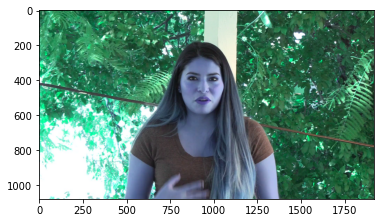

In [60]:
capture_video = cv2.VideoCapture(os.path.join(ROOT_DATA_FOLDER, real_video_sample))
is_readable, img_frame = capture_video.read() #제대로 읽으면 is_readable값은 True, 실패하면 False
plt.imshow(img_frame)

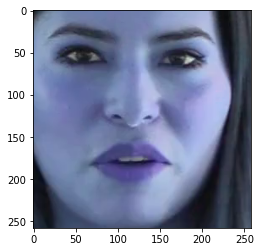

In [61]:
face_rects, scores, idx = detector.run(img_frame, 0)
for i, d in enumerate(face_rects):
    x1 = d.left()
    y1 = d.top()
    x2 = d.right()
    y2 = d.bottom()
plt.imshow(img_frame[y1:y2, x1:x2])

##### 이제 동영상을 재생하면서 이미 정한 조건에 의해 Face Recognition이 몇 회 진행 되는지 확인
##### 조건 : 밀리세컨드 정수 % 올림된 프레임(30) == 0

In [65]:
capture_video = cv2.VideoCapture(os.path.join(ROOT_DATA_FOLDER, real_video_sample))
frameRate = capture_video.get(cv2.CAP_PROP_FPS) # Frame rate.
count = 0
while capture_video.isOpened():
    current_millisecond = capture_video.get(cv2.CAP_PROP_POS_MSEC)# Current position of the video file in milliseconds.
    is_readable, img_frame = capture_video.read() 
    if is_readable != True:
        break
    
    # 영상들의 Frame은 초당 29.97이므로 30으로 맞춰준다.
    # millisecond를 정수로 바꿔준다.
    if (int(current_millisecond) % math.ceil(frameRate)) == 0:
        print("조건에 부합된 millisecond : ", current_millisecond)
        face_rects, scores, idx = detector.run(img_frame, 0)
        for i, d in enumerate(face_rects):
            x1 = d.left()
            y1 = d.top()
            x2 = d.right()
            y2 = d.bottom()
            img_frame[y1:y2, x1:x2]
        count += 1
print(f"Face Recognition이 {count}회 진행됨")

조건에 부합된 millisecond :  0.0
조건에 부합된 millisecond :  0.0
조건에 부합된 millisecond :  300.3003003003003
조건에 부합된 millisecond :  600.6006006006006
조건에 부합된 millisecond :  900.9009009009009
조건에 부합된 millisecond :  3570.2369035702372
조건에 부합된 millisecond :  3870.5372038705373
조건에 부합된 millisecond :  4170.837504170838
조건에 부합된 millisecond :  6840.173506840173
조건에 부합된 millisecond :  7140.4738071404745
조건에 부합된 millisecond :  7440.774107440775
Face Recognition이 11회 진행됨


##### 이제 모든 영상들을 이미지로 캡처하여 Fake와 Real로 나누어서 저장하도록 하자

In [87]:
# 작업을 시작한 시간
before_job = time.clock()
print("start converting videos to images...")
real_video_size = len(real_video_list)
print("real video size : ", real_video_size)
fake_video_size = len(fake_video_list)
print("fake video size : ", fake_video_size)

# 생성된 이미지 저장 횟수
real_count = 0
fake_count = 0

# 비디오 진행 상황
count = 0

print("real video converting 시작...\n")
for real_video_name in real_video_list[:1]:
    print(real_video_name)
    count += 1
    sys.stdout.write("\r"+"["+str(count)+" / "+str(real_video_size)+"]")
    
    capture_video = cv2.VideoCapture(os.path.join(ROOT_DATA_FOLDER, real_video_name))
    frameRate = capture_video.get(cv2.CAP_PROP_FPS) # Frame rate.

    while capture_video.isOpened():
        current_millisecond = capture_video.get(cv2.CAP_PROP_POS_MSEC)# Current position of the video file in milliseconds.
        is_readable, img_frame = capture_video.read() 
        if is_readable != True:
            break

        # 영상들의 Frame은 초당 29.97이므로 30으로 맞춰준다.
        # millisecond를 정수로 바꿔준다.
        if (int(current_millisecond) % math.ceil(frameRate)) == 0:
            face_rects, scores, idx = detector.run(img_frame, 0)
            for i, d in enumerate(face_rects):
                x1 = d.left()
                y1 = d.top()
                x2 = d.right()
                y2 = d.bottom()
                face_image = img_frame[y1:y2, x1:x2]
                real_count +=1
                cv2.imwrite(
                    REAL_DATA_PATH +'/'+ 
                    real_video_name.split('.')[0] +'_' + str(real_count)+'.png', 
                    cv2.resize(face_image, (128, 128)))

# 진행 상황 초기화
print()
count = 0

print("fake video converting 시작...\n")
for fake_video_name in fake_video_list[:1]:
    print(fake_video_name)
    count += 1
    sys.stdout.write("\r"+"["+str(count)+" / "+str(fake_video_size)+"]")
    
    capture_video = cv2.VideoCapture(os.path.join(ROOT_DATA_FOLDER, fake_video_name))
    frameRate = capture_video.get(cv2.CAP_PROP_FPS) # Frame rate.

    while capture_video.isOpened():
        current_millisecond = capture_video.get(cv2.CAP_PROP_POS_MSEC)# Current position of the video file in milliseconds.
        is_readable, img_frame = capture_video.read() 
        if is_readable != True:
            break

        # 영상들의 Frame은 초당 29.97이므로 30으로 맞춰준다.
        # millisecond를 정수로 바꿔준다.
        if (int(current_millisecond) % math.ceil(frameRate)) == 0:
            face_rects, scores, idx = detector.run(img_frame, 0)
            for i, d in enumerate(face_rects):
                x1 = d.left()
                y1 = d.top()
                x2 = d.right()
                y2 = d.bottom()
                face_image = img_frame[y1:y2, x1:x2]
                fake_count +=1
                cv2.imwrite(
                    FAKE_DATA_PATH +'/'+ 
                    fake_video_name.split('.')[0] +'_' + str(fake_count)+'.png', 
                    cv2.resize(face_image, (128, 128)))

print()
# 작업을 끝낸 후 걸린시간 도출
after_job = time.clock()
total_time = after_job - before_job
print("생성된 Real 이미지 : ", real_count)
print("생성된 Fake 이미지 : ", fake_count)
print("총 이미지 갯수 : ", real_count+fake_count)
print('총 소요된 시간: {:.6f} 초'.format(total_time))
print(f"check real folder images: {len(os.listdir(REAL_DATA_PATH))}")
print(f"check fake folder images: {len(os.listdir(FAKE_DATA_PATH))}")

start converting videos to images...
real video size :  77
fake video size :  323
real video converting 시작...

abarnvbtwb.mp4
[1 / 77]
fake video converting 시작...

aagfhgtpmv.mp4
[1 / 323]
생성된 Real 이미지 :  11
생성된 Fake 이미지 :  12
총 이미지 갯수 :  23
총 소요된 시간: 20.699090 초
check real folder images: 11
check fake folder images: 12


## [ 2-1 ] 폴더 및 파일 구성

In [95]:
print(f"REAL 영상 수 : {len(REAL_DATASET_LIST)}, 경로 : {REAL_DATA_PATH}")
print(f"FAKE 영상 수 : {len(FAKE_DATASET_LIST)}, 경로 : {FAKE_DATA_PATH}")

REAL 영상 수 : 759, 경로 : ../../../dataset/deepfake_detection/real
FAKE 영상 수 : 2986, 경로 : ../../../dataset/deepfake_detection/fake


In [97]:


isExistOtherExt = False
for file_set in [os.listdir(os.path.join(ROOT_DATA_FOLDER, classification)) for classification in ['real', 'fake']]:
    for file in file_set:
        if not file.endswith(".png"):
            isExistOtherExt = True
            print(file)
            
if isExistOtherExt:
    print("확장자 .png를 제외한 다른 확장자가 존재합니다.")
else:
    print("모든 파일이 .png 확장자로 구성되어 있습니다.")

모든 파일이 .png 확장자로 구성되어 있습니다.


In [94]:
real_data_name = [ img_name for img_name in os.listdir(REAL_DATA_PATH) ]
print("Real Data File Name List : ")
for name in real_data_name[:10]:
    print(name)
print('=============================')
fake_data_name = [ img_name for img_name in os.listdir(FAKE_DATA_PATH) ]
print("Fake Data File Name List : ")
for name in fake_data_name[:10]:
    print(name)

Real Data File Name List : 
bpapbctoao_10.png
bgvhtpzknn_0.png
abarnvbtwb_4.png
ehccixxzoe_7.png
bxzakyopjf_9.png
clrycekyst_1.png
bejhvclboh_8.png
bmjzrlszhi_0.png
ahqqqilsxt_8.png
bpapbctoao_0.png
Fake Data File Name List : 
cxfujlvsuw_3.png
bhbdugnurr_3.png
bctvsmddgq_4.png
clihsshdkq_6.png
bhpwpydzpo_8.png
dafhtipaml_7.png
cxttmymlbn_3.png
asdpeebotb_1.png
avfitoutyn_3.png
blzydqdfem_2.png


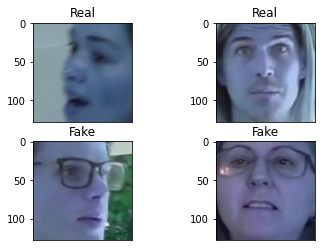

(128, 128, 3)
(128, 128, 3)
(128, 128, 3)
(128, 128, 3)


In [106]:
real_sample1 = os.path.join(REAL_DATA_PATH, real_data_name[10])
real_sample2 = os.path.join(REAL_DATA_PATH, real_data_name[20])
fake_sample1 = os.path.join(FAKE_DATA_PATH, fake_data_name[30])
fake_sample2 = os.path.join(FAKE_DATA_PATH, fake_data_name[40])

real_img_example1 = cv2.imread(real_sample1)
real_img_example2 = cv2.imread(real_sample2)
fake_img_example1 = cv2.imread(fake_sample1)
fake_img_example2 = cv2.imread(fake_sample2)

plt.subplot(2,2,1)
plt.title("Real")
plt.xticks([], [])
plt.imshow(real_img_example1)
plt.subplot(2,2,2)
plt.title("Real")
plt.xticks([], [])
plt.imshow(real_img_example2)
plt.subplot(2,2,3)
plt.title("Fake")
plt.xticks([], [])
plt.imshow(fake_img_example1)
plt.subplot(2,2,4)
plt.title("Fake")
plt.xticks([], [])
plt.imshow(fake_img_example2)
plt.show()

print(real_img_example1.shape)
print(real_img_example2.shape)
print(fake_img_example1.shape)
print(fake_img_example2.shape)

##### 영상데이터에서 얼굴부분을 추출하여 이미지로 저장할 떄 이미 128x128로 resize작업이 완료 되었단 점을 볼 수 있다.
##### 그러므로 resize 작업은 필요없다.

## [ 2-2 ] 데이터셋 준비

In [137]:
# 메모리 사용을 체크해주는 객체 process 생성
process = psutil.Process(os.getpid())

# 라벨링 실행전 메모리 상태 체크
before_time = time.clock()
mem_before = process.memory_info().rss / 1024 / 1024

print("Real 이미지 데이터 불러오고 라벨링 진행")
for img in REAL_DATASET_LIST:
    TRAINABLE_FLOWER_DATA.append(img_to_array(load_img(REAL_DATA_PATH+'/'+img)) / 255.0)
    LABEL.append('real')

print("Fake 이미지 데이터 불러오고 라벨링 진행")
for img in FAKE_DATASET_LIST:
    TRAINABLE_FLOWER_DATA.append(img_to_array(load_img(FAKE_DATA_PATH+'/'+img)) / 255.0)
    LABEL.append('fake')

print("불러온 Trainable 데이터와 라벨링 데이터의 타입을 각각 float32, string으로 변경")
TRAINABLE_FLOWER_DATA = np.array(TRAINABLE_FLOWER_DATA, dtype='float32')
LABEL = np.array(LABEL, dtype=np.str)
print("Trainable : ", TRAINABLE_FLOWER_DATA.shape)
print("Labelling : ", LABEL.shape)

print("라벨링 데이터 One-Hot Encoding 진행")
encoder = LabelEncoder()
one_hot = encoder.fit_transform(LABEL)
one_hot_label = tf.keras.utils.to_categorical(one_hot, 2)
one_hot_label.shape

print("데이터를 train과 test로 나누기 진행")
X_train, X_valid, Y_train, Y_valid = train_test_split(TRAINABLE_FLOWER_DATA, one_hot_label, test_size = 0.25, random_state=42)


# 라벨링 실행후 메모리 상태 체크
after_time = time.clock()
mem_after = process.memory_info().rss / 1024 / 1024
total_time = after_time - before_time

print('시작 전 메모리 사용량: {} MB'.format(mem_before))
print('종료 후 메모리 사용량: {} MB'.format(mem_after))
print('총 소요된 시간: {:.6f} 초'.format(total_time))
print("{:-^16}".format("데이터 전처리 결과"))
print("훈련 데이터 : ",X_train.shape)
print("훈련 라벨링 : ",X_valid.shape)
print("검증 데이터 : ",Y_train.shape)
print("검증 라벨링 : ",Y_valid.shape)


Real 이미지 데이터 불러오고 라벨링 진행
Fake 이미지 데이터 불러오고 라벨링 진행
불러온 Trainable 데이터와 라벨링 데이터의 타입을 각각 float32, string으로 변경
Trainable :  (3745, 128, 128, 3)
Labelling :  (3745,)
라벨링 데이터 One-Hot Encoding 진행
데이터를 train과 test로 나누기 진행
시작 전 메모리 사용량: 2674.7421875 MB
종료 후 메모리 사용량: 3376.93359375 MB
총 소요된 시간: 4.495510 초
---데이터 전처리 결과---
훈련 데이터 :  (2808, 128, 128, 3)
훈련 라벨링 :  (937, 128, 128, 3)
검증 데이터 :  (2808, 2)
검증 라벨링 :  (937, 2)


### 학습 준비 완료!!!

[진행중] Real 이미지 데이터 불러오고 라벨링 중...
[완료]